In [2]:
import sys
sys.path.append("D:/Final Yr Project/MaskRCNN/maskrcnn_colab/mrcnn_demo")

from m_rcnn import *
%matplotlib inline

VERS 0.4 - updated 04/08/2022


In [2]:
images_path = "data.zip"
annotations_path = "edge_crcted_coco.json"

extract_images(os.path.join("D://Final Yr Project//MaskRCNN//",images_path), "D:\\Final Yr Project\\MaskRCNN\\data")

Extracted: 4913 images


In [3]:
dataset_train = load_image_dataset(os.path.join("D://Final Yr Project//MaskRCNN//", annotations_path), "D://Final Yr Project/MaskRCNN//data", "train")
dataset_val = load_image_dataset(os.path.join("D://Final Yr Project//MaskRCNN//", annotations_path), "D://Final Yr Project//MaskRCNN//data", "val")
class_number = dataset_train.count_classes()
print('Train: %d' % len(dataset_train.image_ids))
print('Validation: %d' % len(dataset_val.image_ids))
print("Classes: {}".format(class_number))

Annotation json path:  D://Final Yr Project//MaskRCNN//edge_crcted_coco.json
Annotation json path:  D://Final Yr Project//MaskRCNN//edge_crcted_coco.json
Train: 4267
Validation: 533
Classes: 2


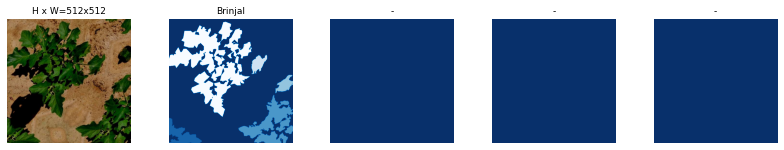

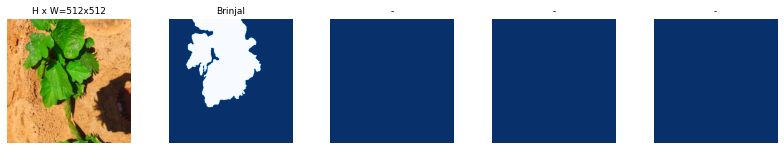

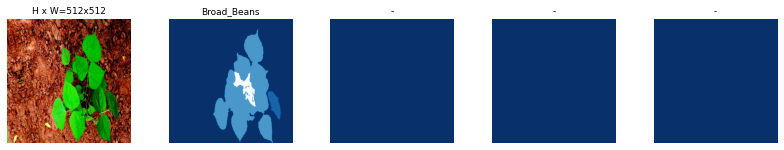

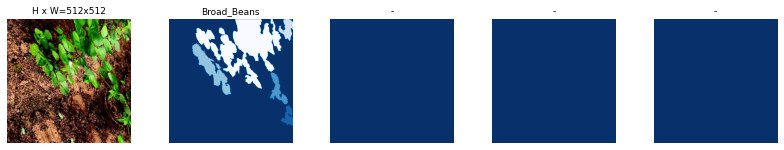

In [4]:
display_image_samples(dataset_train)

In [5]:
# Load Configuration
config = CustomConfig(2)
# config.display()
model = load_training_model(config)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead
D:\Final Yr Project\MaskRCNN\maskrcnn_colab\mask_rcnn_coco.h5


In [21]:
# Start Training
# This operation might take a long time.
train_head(model, dataset_train, dataset_train, config)

Loading weights  D:\Final Yr Project\MaskRCNN\logs\mask_rcnn_object_0050.h5


In [6]:
test_model, inference_config = load_test_model(2)

Loading weights from  D:\Final Yr Project\MaskRCNN\logs\mask_rcnn_object_0029.h5


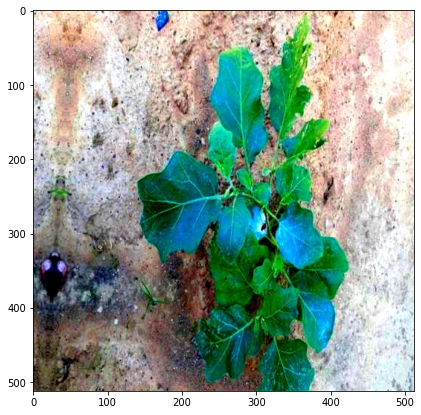

In [41]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread("D:\\Final Yr Project\\MaskRCNN\\data\\brinjal139.jpg")
plt.figure(figsize=(7, 7))
plt.imshow(img) 
plt.show()  # display it

D:\Final Yr Project\MaskRCNN\data\brinjal139.jpg
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
Trained model result
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32
Annotation


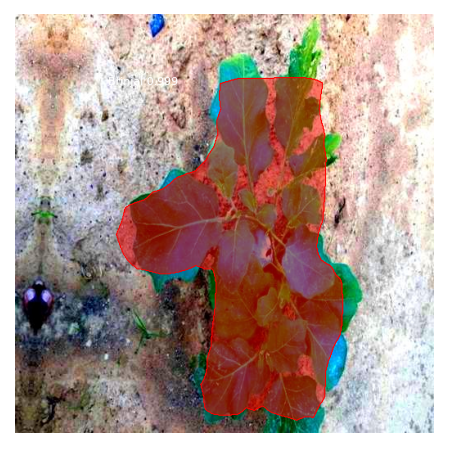

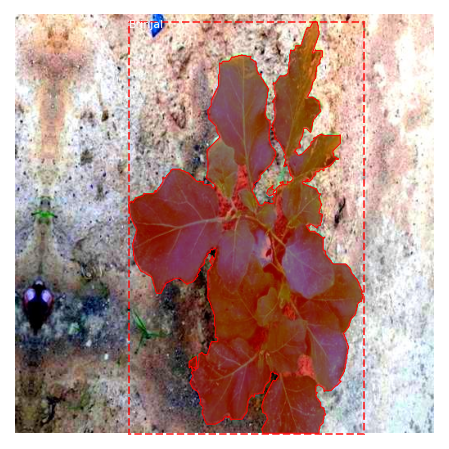

In [40]:
test_random_image(test_model, dataset_val, inference_config)

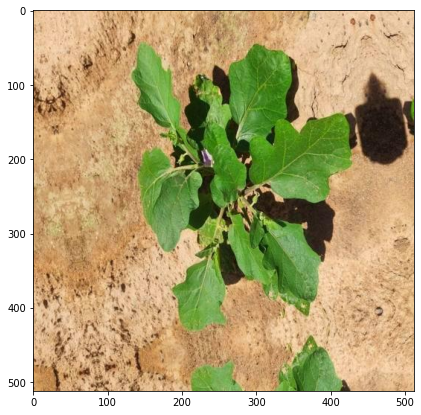

In [37]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread("D:\\Final Yr Project\\MaskRCNN\\data\\brinjal1128.jpg")
plt.figure(figsize=(7, 7))
plt.imshow(img) 
plt.show()  # display it

D:\Final Yr Project\MaskRCNN\data\brinjal1128.jpg
original_image           shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
Trained model result
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  133.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32
Annotation


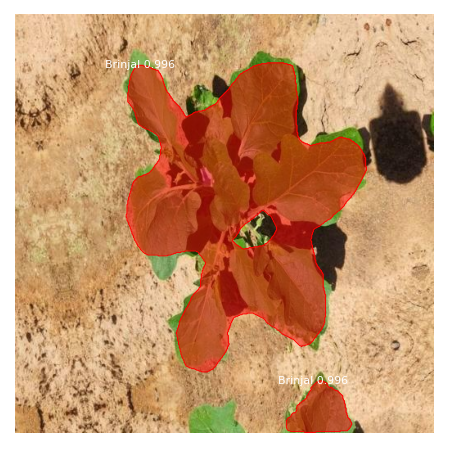

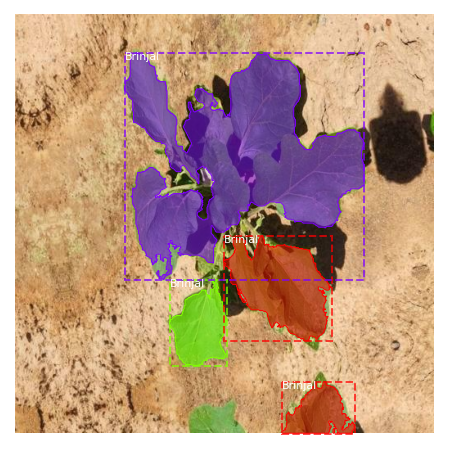

In [8]:
test_random_image(test_model, dataset_val, inference_config)

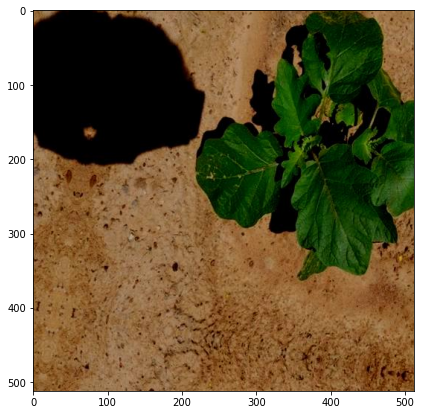

In [32]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img = mpimg.imread("D:\\Final Yr Project\\MaskRCNN\\data\\brinjal1845.jpg")
plt.figure(figsize=(7, 7))
plt.imshow(img) 
plt.show()  # display it

D:\Final Yr Project\MaskRCNN\data\brinjal1845.jpg
original_image           shape: (512, 512, 3)         min:    0.00000  max:  201.00000  uint8
Trained model result
Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  201.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:   77.30000  float64
image_metas              shape: (1, 15)               min:    0.00000  max:  512.00000  int32
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32
Annotation


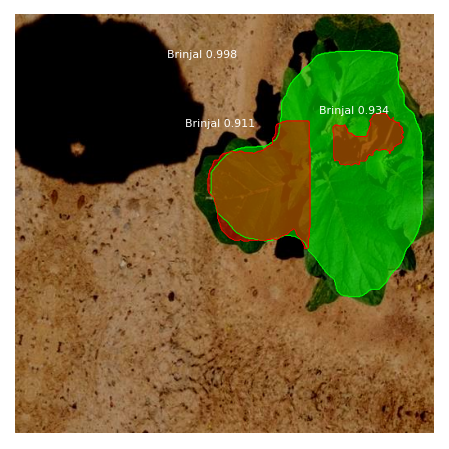

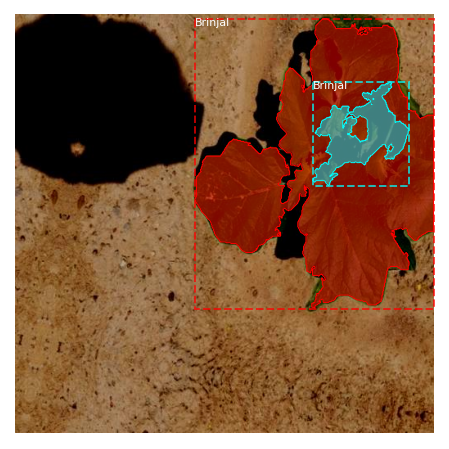

In [14]:
test_random_image(test_model, dataset_val, inference_config)

In [3]:
from mrcnn_demo.visualize import display_instances
from mrcnn_demo.config import Config
from mrcnn_demo.model import MaskRCNN
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


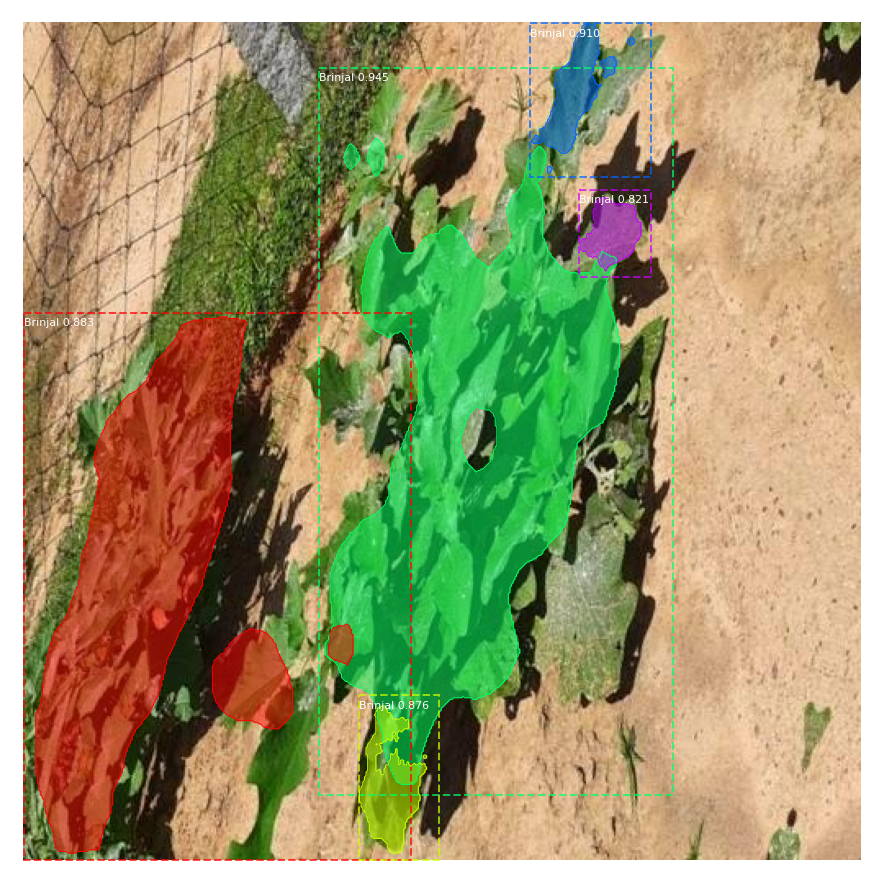

In [4]:
# define 81 classes that the coco model knowns about
class_names = ["Backgorund",'Brinjal','Broad_Beans']

# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights("C:\\Users\\mailp\\Downloads\\mask_rcnn_object_0050.h5", by_name=True)
# load photograph
img = load_img("D:\\Final Yr Project\\data\\images\\val\\brinjal664.jpg")
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

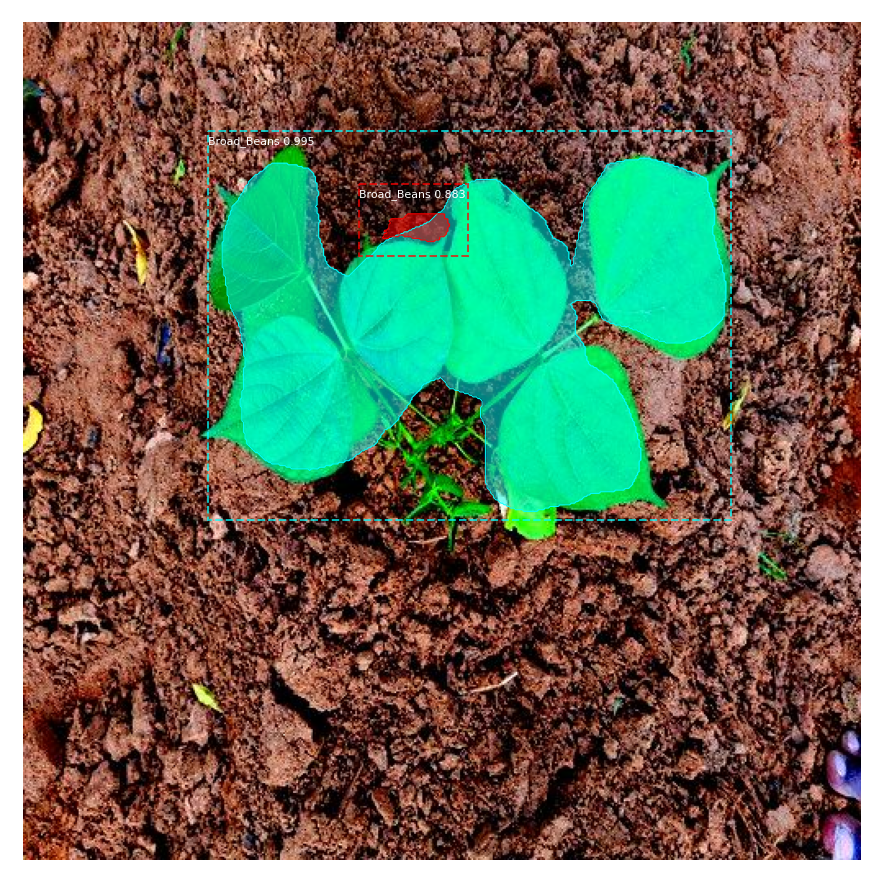

In [5]:
# define 81 classes that the coco model knowns about
class_names = ["Backgorund",'Brinjal','Broad_Beans']

# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights("C:\\Users\\mailp\\Downloads\\mask_rcnn_object_0050.h5", by_name=True)
# load photograph
img = load_img("D:\\Final Yr Project\\data\\images\\val\\broad26.jpg")
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

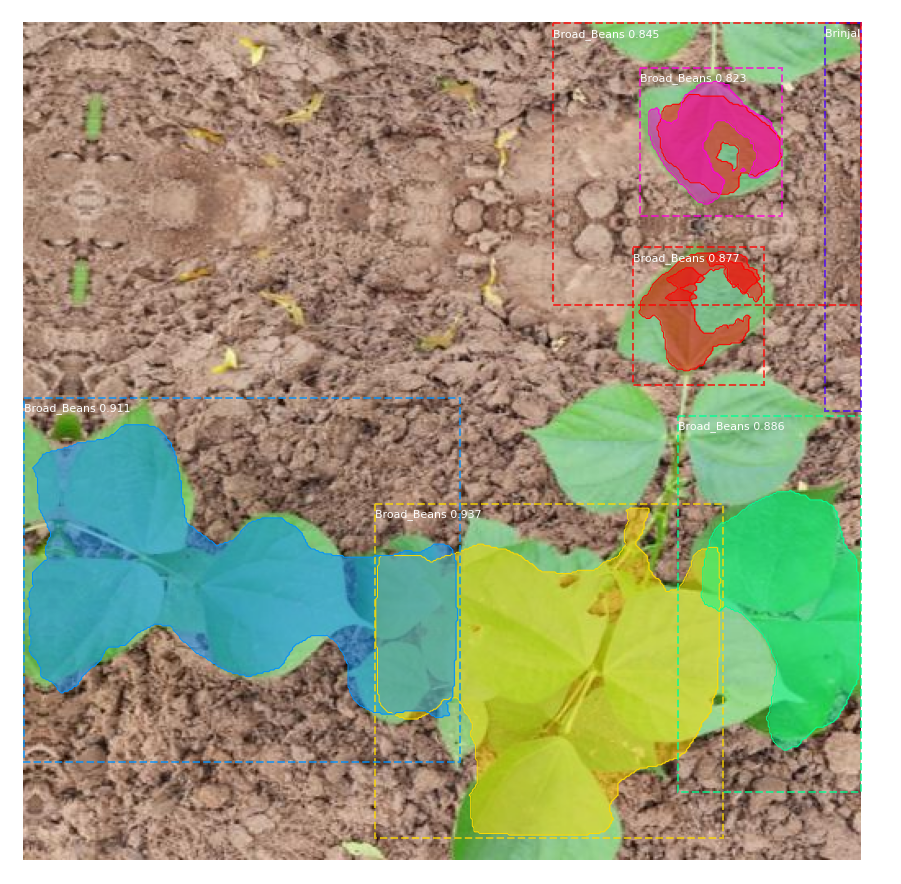

In [6]:
# define 81 classes that the coco model knowns about
class_names = ["Backgorund",'Brinjal','Broad_Beans']

# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights("D:\\Final Yr Project\\MaskRCNN\\logs\\mask_rcnn_object_0029.h5", by_name=True)
# load photograph
img = load_img("D:\\Final Yr Project\\data\\images\\val\\broad349.jpg")
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

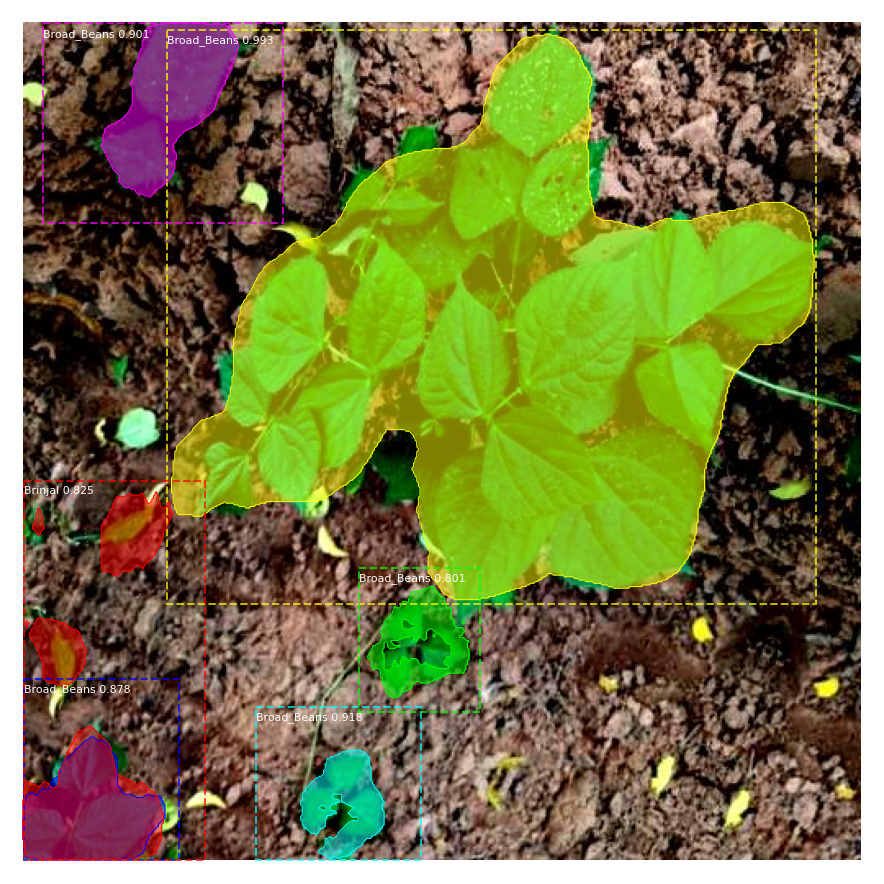

In [7]:
# define 81 classes that the coco model knowns about
class_names = ["Backgorund",'Brinjal','Broad_Beans']

# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights("D:\\Final Yr Project\\MaskRCNN\\logs\\mask_rcnn_object_0029.h5", by_name=True)
# load photograph
img = load_img("D:\\Final Yr Project\\data\\images\\val\\broad630.jpg")
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

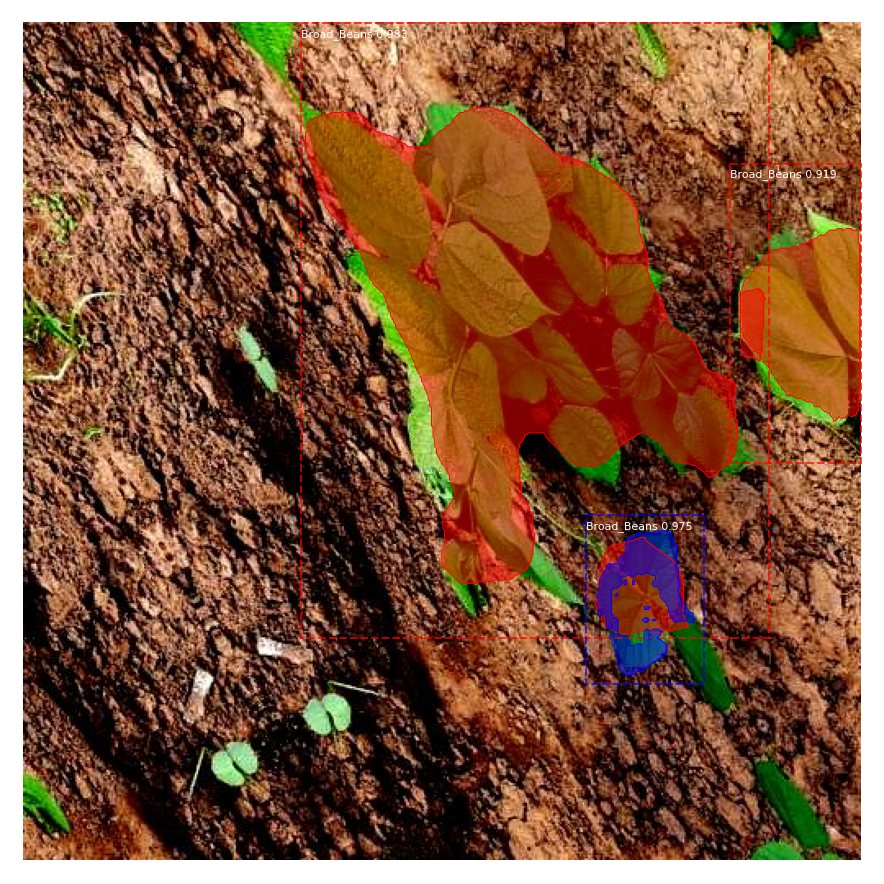

In [8]:
# define 81 classes that the coco model knowns about
class_names = ["Backgorund",'Brinjal','Broad_Beans']

# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights("D:\\Final Yr Project\\MaskRCNN\\logs\\mask_rcnn_object_0029.h5", by_name=True)
# load photograph
img = load_img("D:\\Final Yr Project\\data\\images\\val\\broad636.jpg")
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

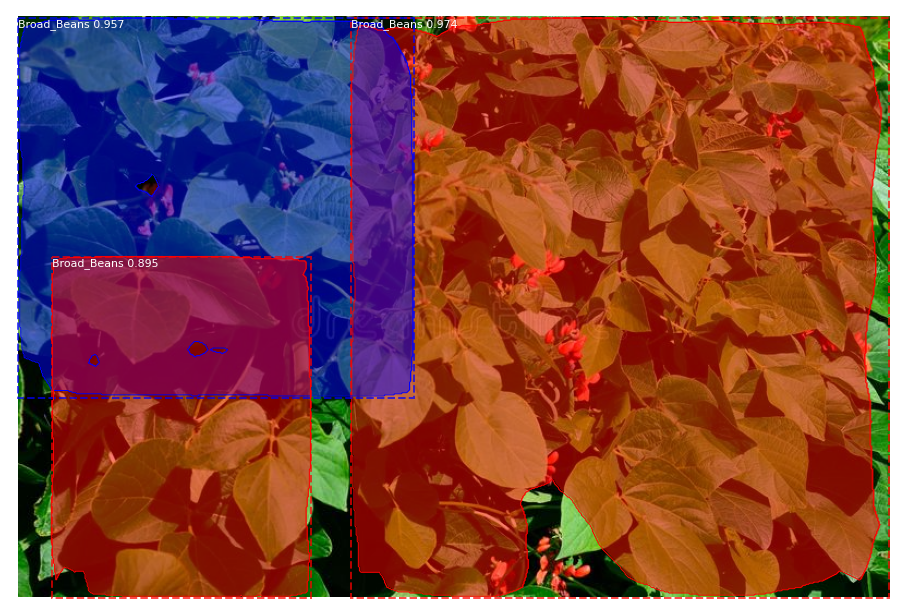

In [9]:
# define 81 classes that the coco model knowns about
class_names = ["Backgorund",'Brinjal','Broad_Beans']

# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 2

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights("D:\\Final Yr Project\\MaskRCNN\\logs\\mask_rcnn_object_0029.h5", by_name=True)
# load photograph
img = load_img("C:\\Users\\mailp\\Desktop\\broad.jpg")
img = img_to_array(img)
# make prediction
results = rcnn.detect([img], verbose=0)
# get dictionary for first prediction
r = results[0]
# show photo with bounding boxes, masks, class labels and scores
display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])